### ML Interpretability

In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
from pdpbox import pdp, get_dataset, info_plots


from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support
from sklearn.model_selection import train_test_split

import lime
import sklearn
import numpy as np
import sklearn
import sklearn.ensemble
import sklearn.metrics
from __future__ import print_function
from sklearn.metrics import f1_score
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import train_test_split
import xgboost
import shap
import numpy as np
import matplotlib.pylab as pl

RuntimeError: module compiled against API version 0xc but this version of numpy is 0xb

lightgbm is installed...but failed to load!


In [2]:
df = pd.read_csv('heloc_dataset_v1.csv')

In [3]:
df.columns

Index(['RiskPerformance', 'ExternalRiskEstimate', 'MSinceOldestTradeOpen',
       'MSinceMostRecentTradeOpen', 'AverageMInFile', 'NumSatisfactoryTrades',
       'NumTrades60Ever2DerogPubRec', 'NumTrades90Ever2DerogPubRec',
       'PercentTradesNeverDelq', 'MSinceMostRecentDelq',
       'MaxDelq2PublicRecLast12M', 'MaxDelqEver', 'NumTotalTrades',
       'NumTradesOpeninLast12M', 'PercentInstallTrades',
       'MSinceMostRecentInqexcl7days', 'NumInqLast6M', 'NumInqLast6Mexcl7days',
       'NetFractionRevolvingBurden', 'NetFractionInstallBurden',
       'NumRevolvingTradesWBalance', 'NumInstallTradesWBalance',
       'NumBank2NatlTradesWHighUtilization', 'PercentTradesWBalance'],
      dtype='object')

In [4]:
df.describe()

,ExternalRiskEstimate,MSinceOldestTradeOpen,MSinceMostRecentTradeOpen,AverageMInFile,NumSatisfactoryTrades,NumTrades60Ever2DerogPubRec,NumTrades90Ever2DerogPubRec,PercentTradesNeverDelq,MSinceMostRecentDelq,MaxDelq2PublicRecLast12M,...,PercentInstallTrades,MSinceMostRecentInqexcl7days,NumInqLast6M,NumInqLast6Mexcl7days,NetFractionRevolvingBurden,NetFractionInstallBurden,NumRevolvingTradesWBalance,NumInstallTradesWBalance,NumBank2NatlTradesWHighUtilization,PercentTradesWBalance
count,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,...,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000,10459.000000
mean,67.425758,184.205373,8.543455,73.843293,19.428052,0.042738,-0.142843,86.661536,6.762406,4.928291,...,32.166460,-0.325366,0.868152,0.812602,31.629888,39.158906,3.185008,0.976097,0.018071,62.079166
std,21.121621,109.683816,13.301745,38.782803,13.004327,2.513910,2.367397,25.999584,20.501250,3.756275,...,20.128634,6.067556,3.179304,3.143698,30.060140,42.101601,4.413173,4.060995,3.358135,27.711565
min,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,...,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,63.000000,118.000000,3.000000,52.000000,12.000000,0.000000,0.000000,87.000000,-7.000000,4.000000,...,20.000000,-7.000000,0.000000,0.000000,5.000000,-8.000000,2.000000,1.000000,0.000000,47.000000
50%,71.000000,178.000000,5.000000,74.000000,19.000000,0.000000,0.000000,96.000000,-7.000000,6.000000,...,31.000000,0.000000,1.000000,1.000000,25.000000,47.000000,3.000000,2.000000,0.000000,67.000000
75%,79.000000,249.500000,11.000000,95.000000,27.000000,1.000000,0.000000,100.000000,14.000000,7.000000,...,44.000000,1.000000,2.000000,2.000000,54.000000,79.000000,5.000000,3.000000,1.000000,82.000000
max,94.000000,803.000000,383.000000,383.000000,79.000000,19.000000,19.000000,100.000000,83.000000,9.000000,...,100.000000,24.000000,66.000000,66.000000,232.000000,471.000000,32.000000,23.000000,18.000000,100.000000


In [5]:
feature_label = ['ExternalRiskEstimate', 'MSinceOldestTradeOpen',
       'MSinceMostRecentTradeOpen', 'AverageMInFile', 'NumSatisfactoryTrades',
       'NumTrades60Ever2DerogPubRec', 'NumTrades90Ever2DerogPubRec',
       'PercentTradesNeverDelq', 'MSinceMostRecentDelq',
       'MaxDelq2PublicRecLast12M', 'MaxDelqEver', 'NumTotalTrades',
       'NumTradesOpeninLast12M', 'PercentInstallTrades',
       'MSinceMostRecentInqexcl7days', 'NumInqLast6M', 'NumInqLast6Mexcl7days',
       'NetFractionRevolvingBurden', 'NetFractionInstallBurden',
       'NumRevolvingTradesWBalance', 'NumInstallTradesWBalance',
       'NumBank2NatlTradesWHighUtilization', 'PercentTradesWBalance']

In [6]:
df['RiskPerformance'] = [0 if x =='Bad' else 1 for x in df['RiskPerformance']]

In [7]:
features = df.drop('RiskPerformance', axis = 1)
target = df['RiskPerformance']
target_label = ['RiskPerformance']


In [8]:
features_train, features_test, labels_train, labels_test = train_test_split(
    features, target, test_size=0.3)

In [9]:
y = 'RiskPerformance'
X = [name for name in df.columns if name not in [y]]

mono_constraints = tuple([int(i) for i in np.sign(df[X + [y]].corr()[y].values[:-1])])

In [10]:
#Initializing XGBoost Classifier.

import xgboost as xgb

# XGBoost uses SVMLight data structure, not Numpy arrays or Pandas DataFrames
dtrain = xgb.DMatrix(features_train, labels_train)
dtest = xgb.DMatrix(features_test, labels_test)

# used to calibrate predictions to mean of y
base_y = labels_train.mean()

# tuning parameters
params = {
    'objective':
    'binary:logistic',  # produces 0-1 probabilities for binary classification
    'booster':
    'gbtree',  # base learner will be decision tree
    'eval_metric':
    'auc',  # stop training based on maximum AUC, AUC always between 0-1
    'eta':
    0.08,  # learning rate
    'subsample':
    0.9,  # use 90% of rows in each decision tree
    'colsample_bytree':
    0.9,  # use 90% of columns in each decision tree
    'max_depth':
    15,  # allow decision trees to grow to depth of 15
    'monotone_constraints':
    mono_constraints,  # 1 = increasing relationship, -1 = decreasing relationship
    'base_score':
    base_y,  # calibrate predictions to mean of y 
    'seed':
    12345  # set random seed for reproducibility
}

# watchlist is used for early stopping
watchlist = [(dtrain, 'train'), (dtest, 'eval')]


# train model
xgb_model = xgb.train(
    params,  # set tuning parameters from above                   
    dtrain,  # training data
    1000,  # maximum of 1000 iterations (trees)
    evals=watchlist,  # use watchlist for early stopping 
    early_stopping_rounds=
    50,  # stop after 50 iterations (trees) without increase in AUC
    verbose_eval=True)  # display iteration progress


[16:47:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 124 extra nodes, 0 pruned nodes, max_depth=9
[0]	train-auc:0.778384	eval-auc:0.770706
Multiple eval metrics have been passed: 'eval-auc' will be used for early stopping.

Will train until eval-auc hasn't improved in 50 rounds.
[16:47:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 134 extra nodes, 0 pruned nodes, max_depth=9
[1]	train-auc:0.786967	eval-auc:0.7814
[16:47:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 126 extra nodes, 0 pruned nodes, max_depth=9
[2]	train-auc:0.789922	eval-auc:0.784065
[16:47:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 128 extra nodes, 0 pruned nodes, max_depth=9
[3]	train-auc:0.789675	eval-auc:0.782868
[16:47:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 146 extra nodes, 0 pruned nodes, max_depth=9
[4]	train-auc:0.790071	eval-auc:0.782082
[16:47:46] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 122 extra nodes, 0 prun

[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=13
[52]	train-auc:0.816344	eval-auc:0.795724
[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra nodes, 0 pruned nodes, max_depth=12
[53]	train-auc:0.816602	eval-auc:0.795829
[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 260 extra nodes, 0 pruned nodes, max_depth=15
[54]	train-auc:0.816762	eval-auc:0.795705
[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extra nodes, 0 pruned nodes, max_depth=15
[55]	train-auc:0.816994	eval-auc:0.795749
[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 172 extra nodes, 0 pruned nodes, max_depth=13
[56]	train-auc:0.817261	eval-auc:0.795677
[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 212 extra nodes, 0 pruned nodes, max_depth=15
[57]	train-auc:0.817445	eval-auc:0.795903
[16:47:48] src/tree/updater_prune.cc:74: tree pruning end, 1 roo

[16:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 192 extra nodes, 0 pruned nodes, max_depth=15
[105]	train-auc:0.823608	eval-auc:0.796254
[16:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extra nodes, 0 pruned nodes, max_depth=12
[106]	train-auc:0.823744	eval-auc:0.796184
[16:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 220 extra nodes, 0 pruned nodes, max_depth=15
[107]	train-auc:0.823702	eval-auc:0.796205
[16:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 252 extra nodes, 0 pruned nodes, max_depth=15
[108]	train-auc:0.823861	eval-auc:0.796308
[16:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 210 extra nodes, 0 pruned nodes, max_depth=15
[109]	train-auc:0.823907	eval-auc:0.796358
[16:47:50] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=15
[110]	train-auc:0.824002	eval-auc:0.796291
[16:47:50] src/tree/updater_prune.cc:74: tree pruning end,

[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra nodes, 0 pruned nodes, max_depth=13
[158]	train-auc:0.825929	eval-auc:0.795815
[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=15
[159]	train-auc:0.825973	eval-auc:0.795896
[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=15
[160]	train-auc:0.825998	eval-auc:0.795855
[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 142 extra nodes, 0 pruned nodes, max_depth=15
[161]	train-auc:0.826075	eval-auc:0.79578
[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=15
[162]	train-auc:0.826058	eval-auc:0.7959
[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 232 extra nodes, 0 pruned nodes, max_depth=15
[163]	train-auc:0.826129	eval-auc:0.795811
[16:47:52] src/tree/updater_prune.cc:74: tree pruning end, 1 

In [101]:
predict = xgb_model.predict(dtrain)

accuracy = accuracy_score(labels_test, predict)

auc = roc_auc_score(labels_test, predict)

print('accuracy for GAM: {0}'.format(accuracy))
print('auc for GAM: {0}'.format(auc))


ValueError: Found input variables with inconsistent numbers of samples: [3138, 7321]

XGBoost with monotonicity Eval Auc - 0.796383


#### Feature Importances.

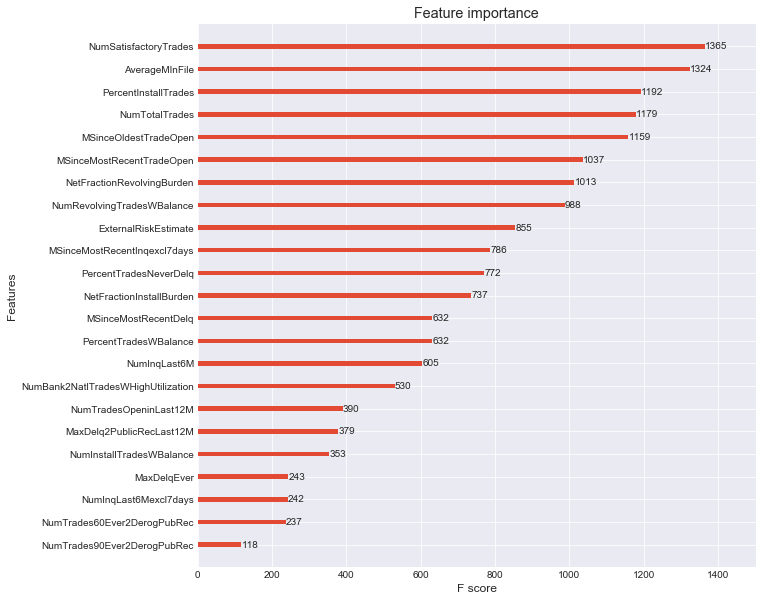

In [108]:
# _ = xgb.plot_importance(xgb_model)
fig, ax = plt.subplots(figsize=(10, 10))
xgboost.plot_importance(xgb_model, ax=ax)
# print(XGB_model.feature_importances_)

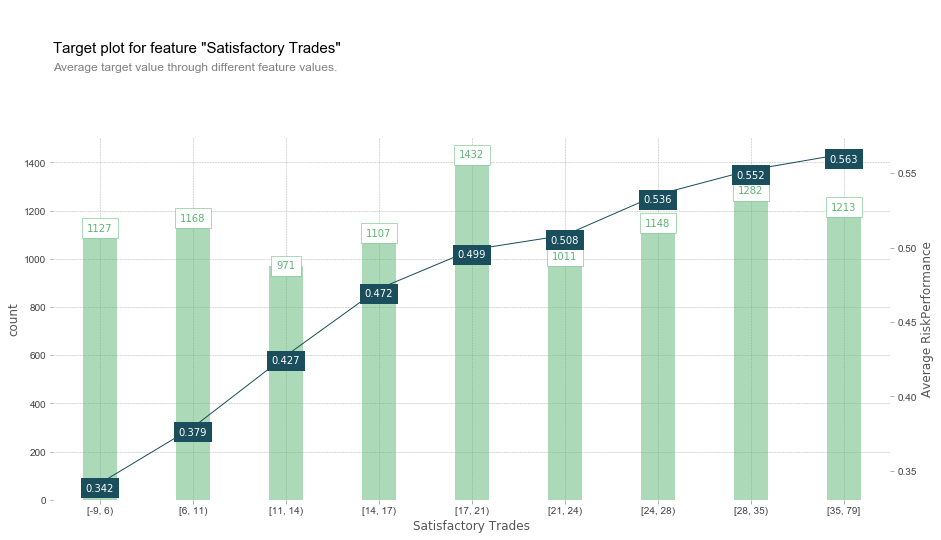

In [12]:
fig, axes, summary_df = info_plots.target_plot( df=df, feature='NumSatisfactoryTrades', feature_name='Satisfactory Trades', 
    target=target_label)

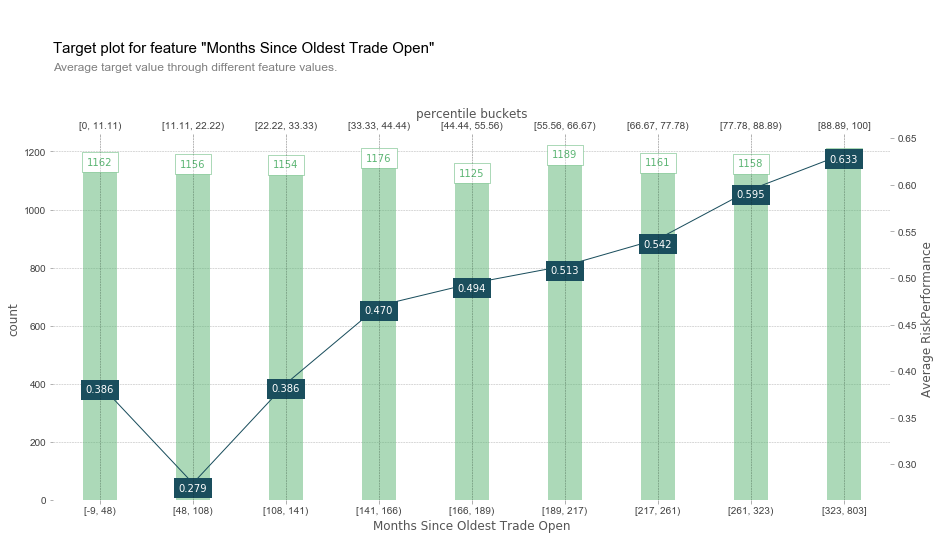

In [13]:
fig, axes, summary_df = info_plots.target_plot(
    df=df,
    feature='MSinceOldestTradeOpen',
    feature_name='Months Since Oldest Trade Open',
    target=target_label,
    show_percentile=True)


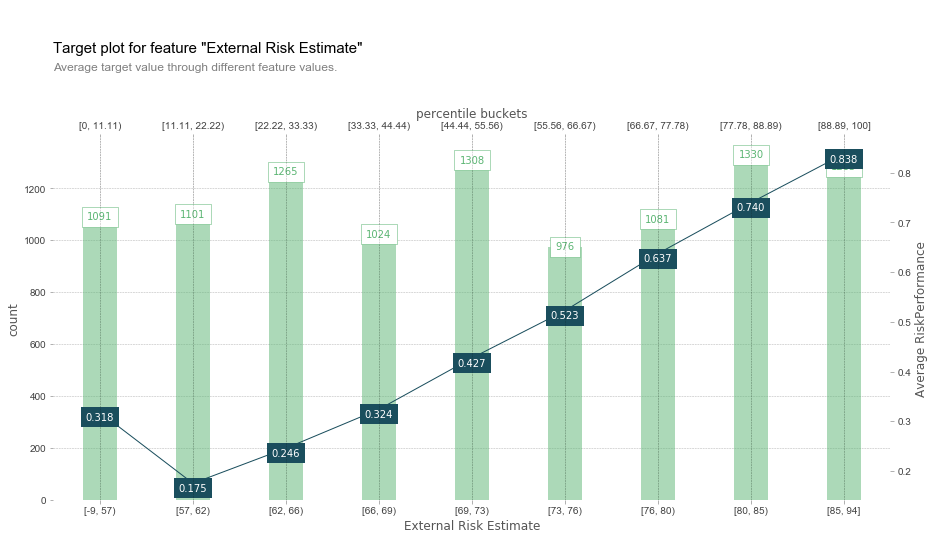

In [14]:
fig, axes, summary_df = info_plots.target_plot(
    df=df,
    feature='ExternalRiskEstimate',
    feature_name='External Risk Estimate',
    target=target_label,
    show_percentile=True)

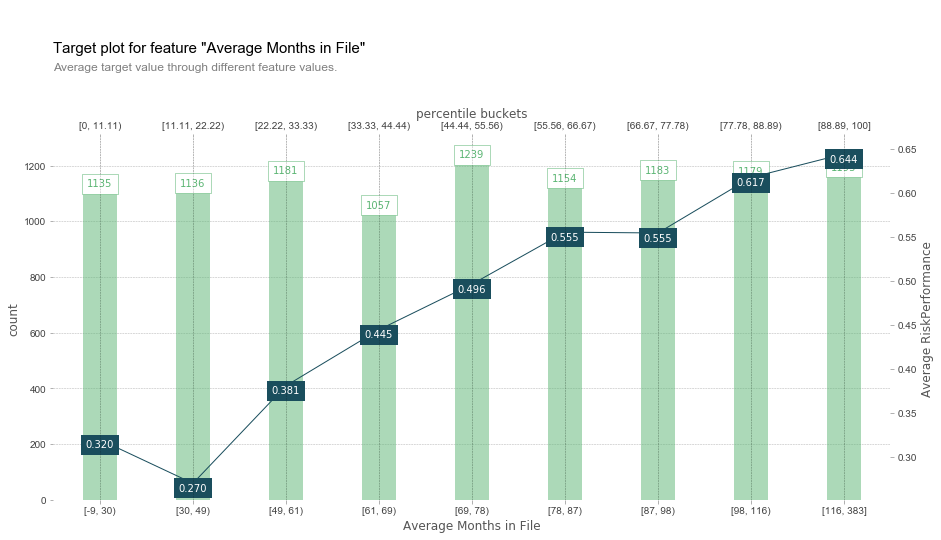

In [15]:
fig, axes, summary_df = info_plots.target_plot(
    df=df,
    feature='AverageMInFile',
    feature_name='Average Months in File',
    target=target_label,
    show_percentile=True)

In [16]:
gbm = GradientBoostingClassifier()
gbm.fit(features.values, target)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

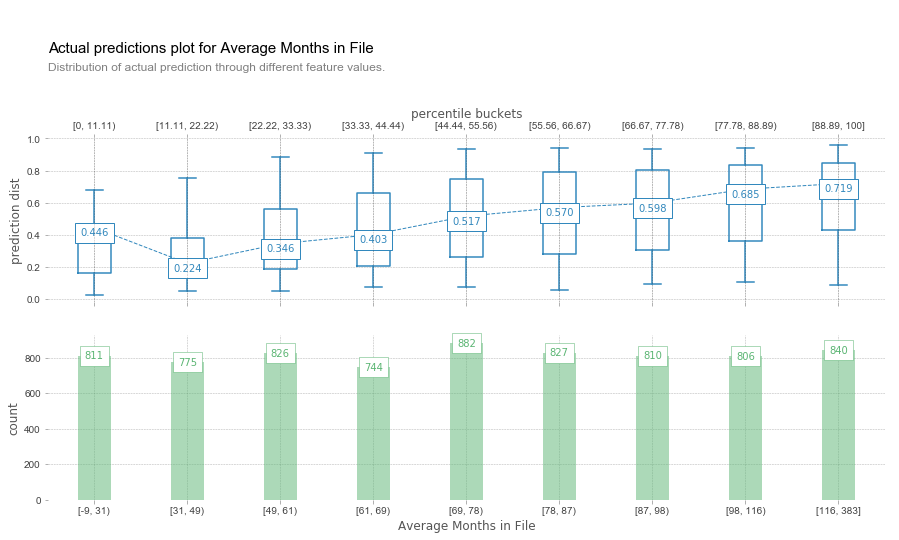

In [17]:
fig, axes, summary_df = info_plots.actual_plot(
    model=gbm, X=features_train, feature='AverageMInFile',
    feature_name='Average Months in File', 
    show_percentile=True,predict_kwds = {}
)

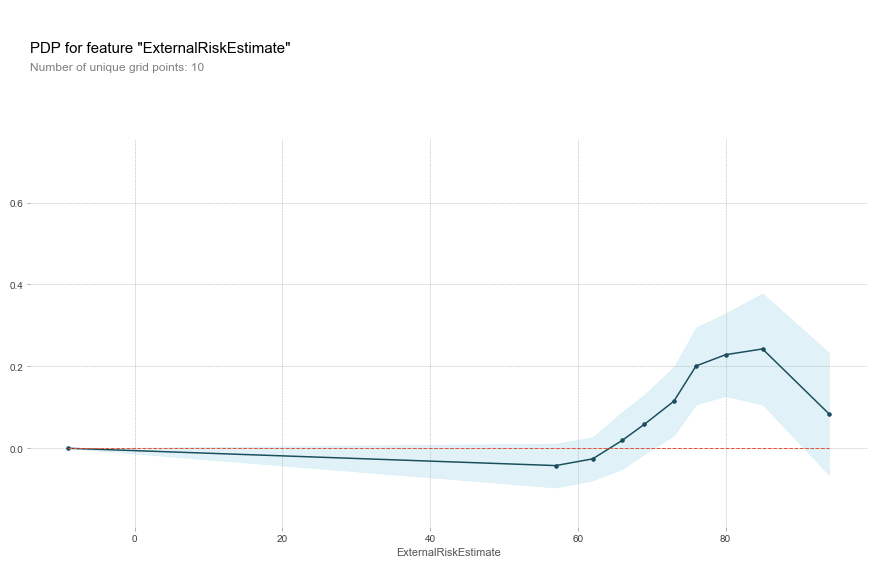

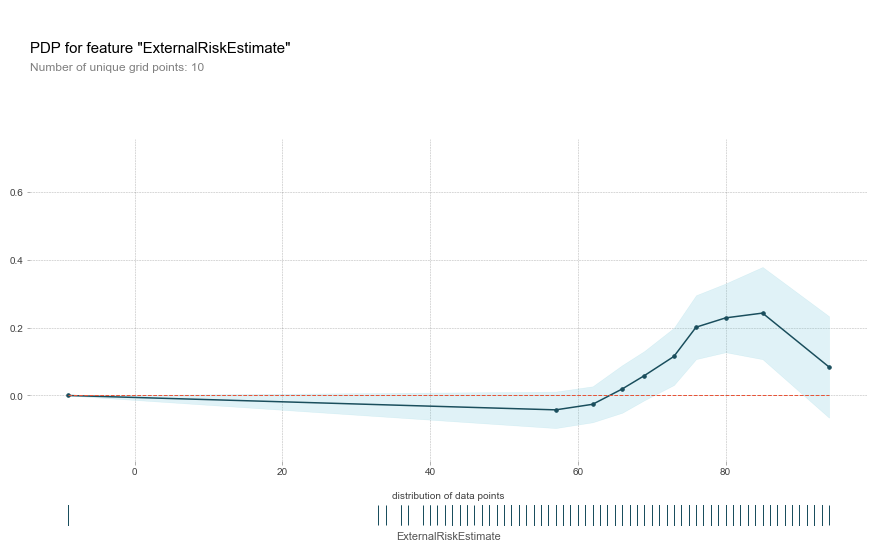

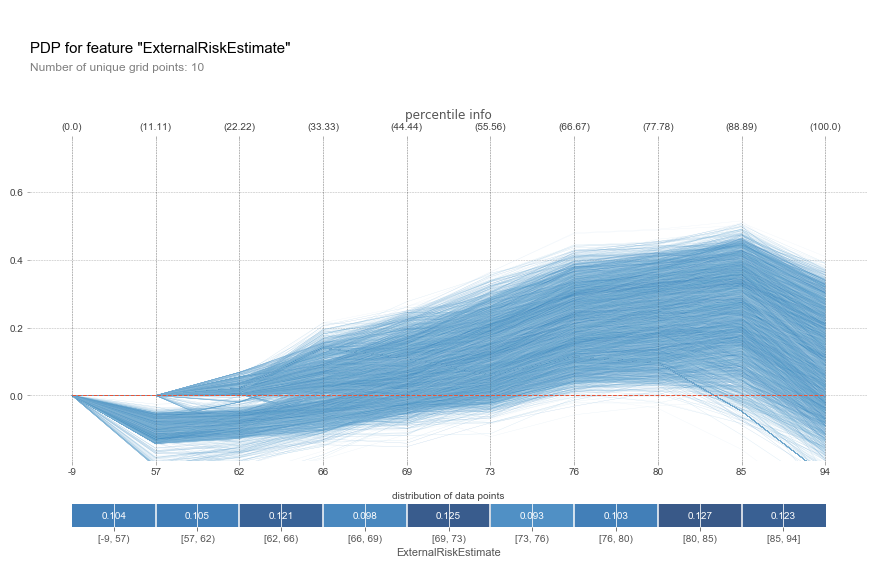

In [20]:
from pdpbox import pdp, get_dataset, info_plots

pdp_min_file = pdp.pdp_isolate(
    model=gbm,
    dataset=df,
    model_features=list(features.columns),
    feature='ExternalRiskEstimate')

fig, axes = pdp.pdp_plot(pdp_min_file, 'ExternalRiskEstimate')

fig, axes = pdp.pdp_plot(
    pdp_min_file, 'ExternalRiskEstimate', plot_pts_dist=True)

fig, axes = pdp.pdp_plot(
    pdp_min_file,
    'ExternalRiskEstimate',
    frac_to_plot=0.5,
    plot_lines=True,
    x_quantile=True,
    show_percentile=True,
    plot_pts_dist=True, plot_params={'pdp_linewidth': 0,'fill_alpha': 0,'markersize': 0})

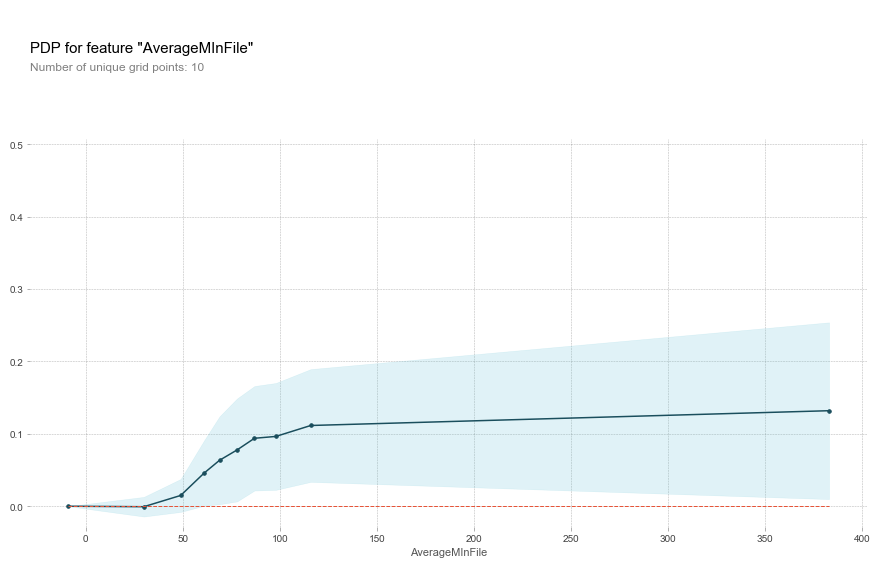

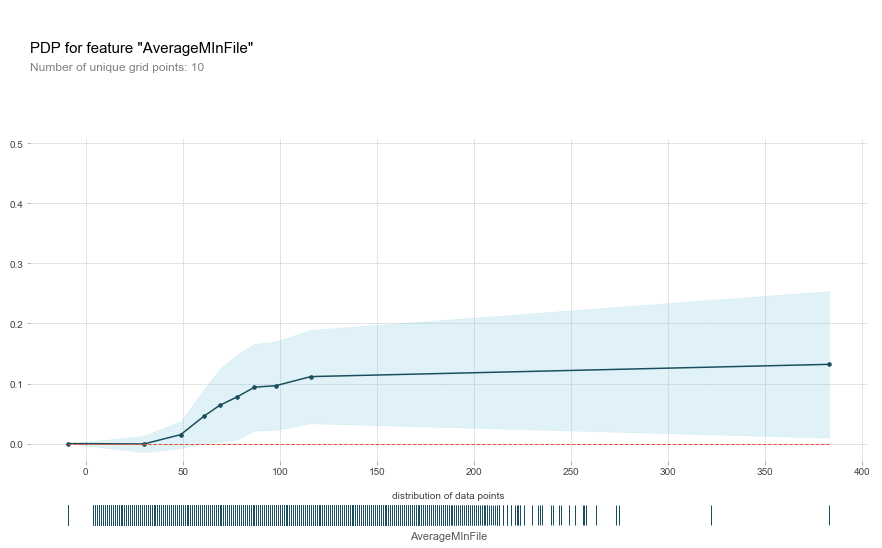

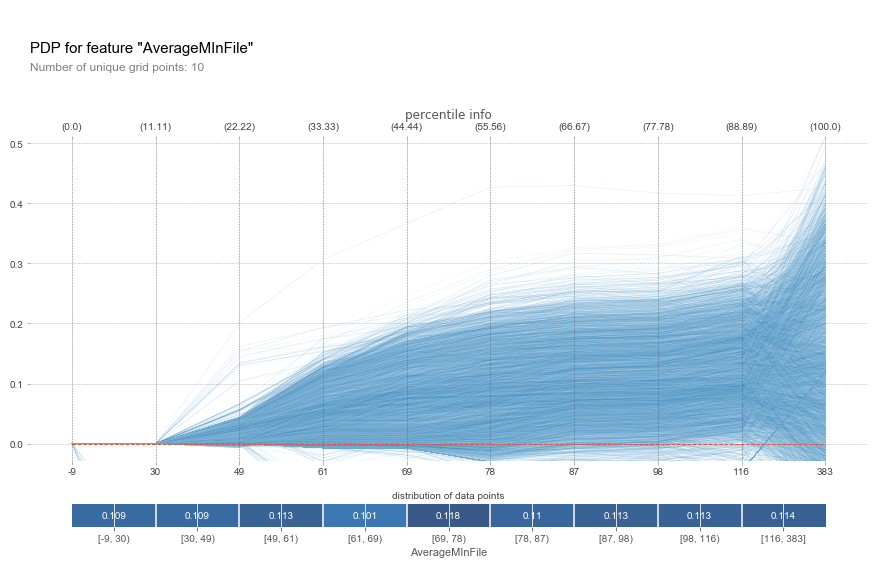

In [21]:
from pdpbox import pdp, get_dataset, info_plots

pdp_min_file = pdp.pdp_isolate(
    model=gbm,
    dataset=df,
    model_features=list(features.columns),
    feature='AverageMInFile')

fig, axes = pdp.pdp_plot(pdp_min_file, 'AverageMInFile')

fig, axes = pdp.pdp_plot(pdp_min_file, 'AverageMInFile', plot_pts_dist=True)

fig, axes = pdp.pdp_plot(
    pdp_min_file,
    'AverageMInFile',
    frac_to_plot=0.5,
    plot_lines=True,
    x_quantile=True,
    show_percentile=True,
    plot_pts_dist=True,
    plot_params={'pdp_linewidth': 0,'fill_alpha': 0,'markersize': 0})

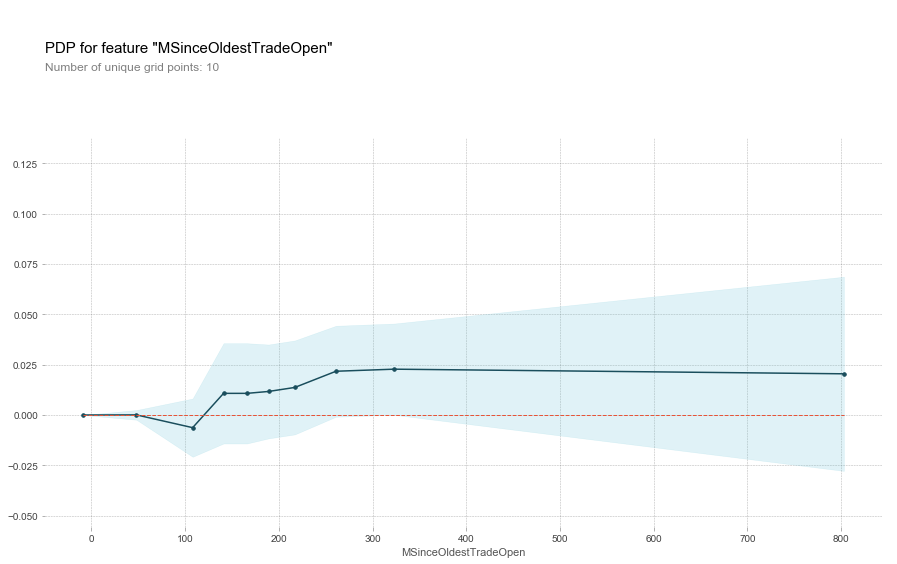

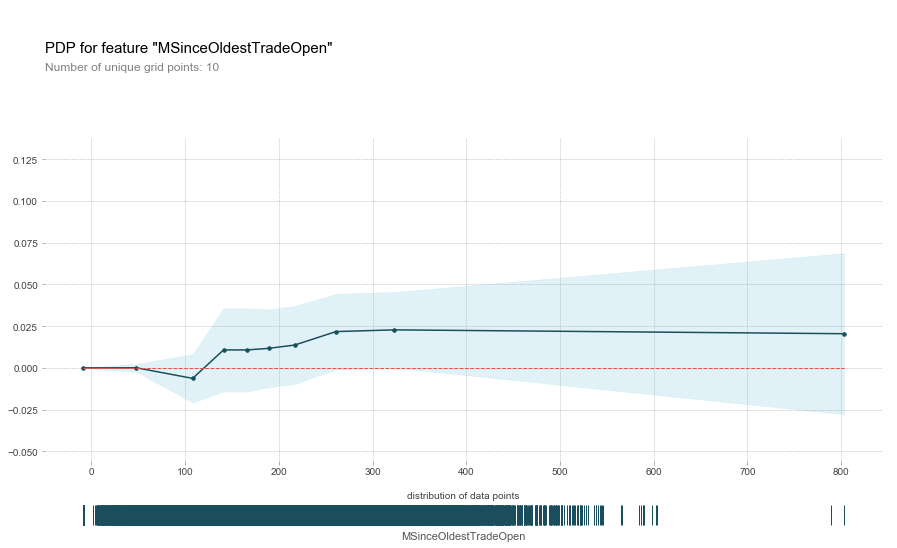

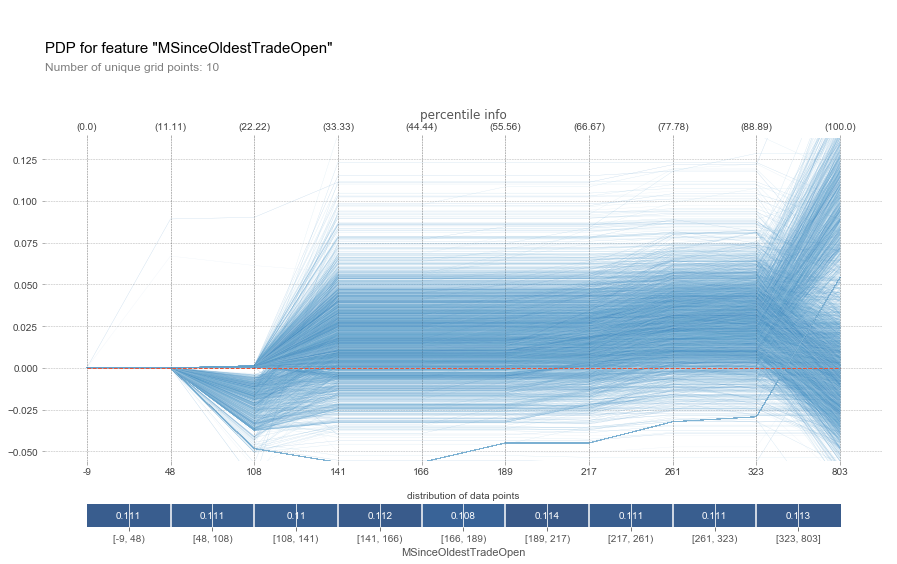

In [22]:
from pdpbox import pdp, get_dataset, info_plots

pdp_min_file = pdp.pdp_isolate(
    model=gbm,
    dataset=df,
    model_features=list(features.columns),
    feature='MSinceOldestTradeOpen')

fig, axes = pdp.pdp_plot(pdp_min_file, 'MSinceOldestTradeOpen')

fig, axes = pdp.pdp_plot(
    pdp_min_file, 'MSinceOldestTradeOpen', plot_pts_dist=True)

fig, axes = pdp.pdp_plot(
    pdp_min_file,
    'MSinceOldestTradeOpen',
    frac_to_plot=0.5,
    plot_lines=True,
    x_quantile=True,
    show_percentile=True,
    plot_pts_dist=True,
    plot_params={'pdp_linewidth': 0,'fill_alpha': 0,'markersize': 0})

#### Function for calculating partial dependence

Since partial dependence and ICE will be calculated for several important variables in the GBM model, it's convenient to have a function doing so. It's probably best to analyze partial dependence and ICE for all variables in a model, but only the top three most important input variables will be investigated here. It's also a good idea to analyze partial dependence and ICE on the test data, or other holdout datasets, to see how the model will perform on new data. This simple function is designed to return partial dependence when it is called for an entire dataset and ICE when it is called for a single row. The bins argument will be used later to calculate ICE values at the same places in an input variable domain that partial dependence is calculated directly below.

In [23]:
def par_dep(xs, frame, model, resolution=20, bins=None):
    
    """ Creates Pandas DataFrame containing partial dependence for a 
        single variable.
    
    Args:
        xs: Variable for which to calculate partial dependence.
        frame: Pandas DataFrame for which to calculate partial dependence.
        model: XGBoost model for which to calculate partial dependence.
        resolution: The number of points across the domain of xs for which 
                    to calculate partial dependence, default 20.
        bins: List of values at which to set xs, default 20 equally-spaced 
              points between column minimum and maximum.
    
    Returns:
        Pandas DataFrame containing partial dependence values.
        
    """
    
    # turn off pesky Pandas copy warning
    pd.options.mode.chained_assignment = None
    
    # initialize empty Pandas DataFrame with correct column names
    par_dep_frame = pd.DataFrame(columns=[xs, 'partial_dependence'])
    
    # cache original column values 
    col_cache = frame.loc[:, xs].copy(deep=True)
  
    # determine values at which to calculate partial dependence
    if bins == None:
        min_ = frame[xs].min()
        max_ = frame[xs].max()
        by = (max_ - min_)/resolution
        bins = np.arange(min_, max_, by)
        
    # calculate partial dependence  
    # by setting column of interest to constant 
    # and scoring the altered data and taking the mean of the predictions
    for j in bins:
        frame.loc[:, xs] = j
        dframe = xgb.DMatrix(frame)
        par_dep_i = pd.DataFrame(model.predict(dframe))
        par_dep_j = par_dep_i.mean()[0]
        par_dep_frame = par_dep_frame.append({xs:j,
                                              'partial_dependence': par_dep_j}, 
                                              ignore_index=True)
        
    # return input frame to original cached state    
    frame.loc[:, xs] = col_cache

    return par_dep_frame

Calculate partial dependence for the most important input variables in the GBM
The partial dependence for LIMIT_BAL can be seen to decrease as credit balance limits increase. This finding is aligned with expectations that the model predictions will be monotonically decreasing with increasing LIMIT_BAL and parsimonious with well-known business practices in credit lending. Partial dependence for other important values is displayed in plots further below.

In [24]:
par_dep_satisfactory_trades = par_dep('NumSatisfactoryTrades', features_test, xgb_model) # calculate partial dependence for Satisfactory Trades
par_dep_average_min_file = par_dep('AverageMInFile',features_test, xgb_model)  # calculate partial dependence for Average min file
par_dep_install_trades = par_dep('PercentInstallTrades',features_test, xgb_model) # calculate partial dependence for Percent install trade



#### Helper function for finding percentiles of predictions


ICE can be calculated for any row in the training or test data, but without intimate knowledge of a data source it can be difficult to know where to apply ICE. Calculating and analyzing ICE curves for every row of training and test data set can be overwhelming, even for the example credit card default dataset. One place to start with ICE is to calculate ICE curves at every decile of predicted probabilities in a dataset, giving an indication of local prediction behavior across the dataset. The function below finds and returns the row indices for the maximum, minimum, and deciles of one column in terms of another

In [25]:
from pycebox.ice import ice, ice_plot
from sklearn.ensemble import GradientBoostingClassifier

In [26]:
gbm = GradientBoostingClassifier()
gbm.fit(features.values, target)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.1, loss='deviance', max_depth=3,
              max_features=None, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              presort='auto', random_state=None, subsample=1.0, verbose=0,
              warm_start=False)

In [27]:
def _get_grid_points(x, num_grid_points):
    if num_grid_points is None:
        return x.unique()
    else:
        # unique is necessary, because if num_grid_points is too much larger
        # than x.shape[0], there will be duplicate quantiles (even with
        # interpolation)
        return x.quantile(np.linspace(0, 1, num_grid_points)).unique()


In [28]:
def _to_ice_data(data, column, x_s):
    """
    Create the DataFrame necessary for ICE calculations
    """
    ice_data = pd.DataFrame(np.repeat(data.values, x_s.size, axis=0), columns=data.columns)
    data_column = ice_data[column].copy()
    ice_data[column] = np.tile(x_s, data.shape[0])

    return ice_data, data_column

In [29]:
def _get_quantiles(x):
    return np.greater.outer(x, x).sum(axis=1) / x.size

In [30]:
def ice(data, column, predict, num_grid_points=None):
    """
    Generate individual conditional expectation (ICE) curves for a model.
    :param data: the sample data from which to generate ICE curves
    :type data: ``pandas`` ``DataFrame``
    :param column: the name of the column in ``data`` that will be varied to
        generate ICE curves
    :type column: ``str``
    :param predict: the function that generates predictions from the model.
        Must accept a ``DataFrame`` with the same columns as ``data``.
    :type predict: callable
    :param num_grid_points: the number of grid points to use for the independent
        variable of the ICE curves. The independent variable values for the
        curves will be quantiles of the data.
        If ``None``, the values of the independent variable will be the unique
        values of ``data[column]``.
    :type num_grid_points: ``None`` or ``int``
    :return: A ``DataFrame`` whose columns are ICE curves.  The row index is the
        independent variable, and the column index is the original data point
        corresponding to that ICE curve.
    :rtype: ``pandas`` ``DataFrame``
    """
    x_s = _get_grid_points(data[column], num_grid_points)
    ice_data, orig_column = _to_ice_data(data, column, x_s)
    ice_data['ice_y'] = predict(ice_data.values)[:, 0]
    ice_data['data_{}'.format(column)] = orig_column

    other_columns = ['data_{}'.format(column)] + [col for col in data.columns if col != column]
    ice_data = ice_data.pivot_table(values='ice_y', index=other_columns, columns=column).T

    return ice_data

In [31]:
satisfactory_trades_df = ice(data=features_train, column='NumSatisfactoryTrades', 
                   predict= gbm.predict_proba)
average_months_df = ice(data=features_train, column='AverageMInFile', 
                   predict = gbm.predict_proba)
percent_installments_df = ice(data=features_train, column='PercentInstallTrades', 
                   predict= gbm.predict_proba)

In [32]:
def pdp(ice_data):
    """
    Calculate a partial dependence plot from ICE data
    :param ice_data: the ICE data generated by :func:`pycebox.ice.ice`
    :type ice_data: ``pandas`` ``DataFrame``
    :return: the partial dependence plot curve
    :rtype: ``pandas`` ``Series``
    """
    return ice_data.mean(axis=1)

In [33]:
import numpy as np
_ = satisfactory_trades_df.columns
_ = np.random.choice(_, 100)
subset_satisfactory = satisfactory_trades_df.loc[:, _]

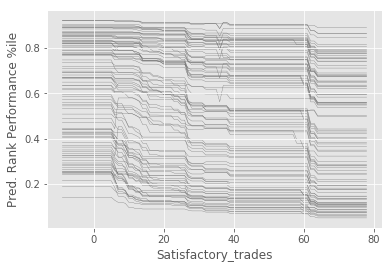

In [34]:
ice_plot(subset_satisfactory, c='dimgray', linewidth=0.3)
plt.ylabel('Pred. Rank Performance %ile')
plt.xlabel('Satisfactory_trades');

In [35]:
import numpy as np
_ = average_months_df.columns
_ = np.random.choice(_, 100)
subset_average = average_months_df.loc[:, _]

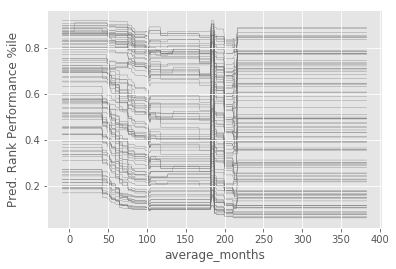

In [36]:
ice_plot(subset_average, c='dimgray', linewidth=0.3)
plt.ylabel('Pred. Rank Performance %ile')
plt.xlabel('average_months');

In [37]:
import numpy as np
_ = percent_installments_df.columns
_ = np.random.choice(_, 100)
subset_installments = percent_installments_df.loc[:, _]

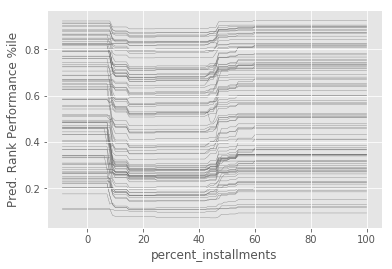

In [38]:
ice_plot(subset_installments, c='dimgray', linewidth=0.3)
plt.ylabel('Pred. Rank Performance %ile')
plt.xlabel('percent_installments');

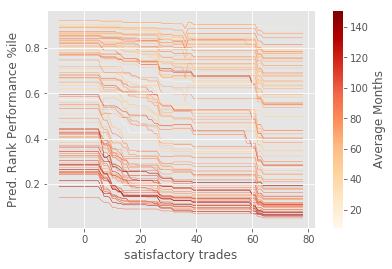

In [39]:
# new colormap for ICE plot
cmap2 = plt.get_cmap('OrRd')
# set color_by to Wt, in order to color each curve by that player's weight
ice_plot(subset_satisfactory, linewidth=0.5, color_by='AverageMInFile', cmap=cmap2)
# ice_plot doesn't return a colorbar so we have to add one
# hack to add in colorbar taken from here:
# https://stackoverflow.com/questions/8342549/matplotlib-add-colorbar-to-a-sequence-of-line-plots/11558629#11558629
avg_min_vals = subset_satisfactory.columns.get_level_values('AverageMInFile').values
sm = plt.cm.ScalarMappable(cmap=cmap2, 
                           norm=plt.Normalize(vmin=avg_min_vals.min(), 
                                              vmax=avg_min_vals.max()))
# need to create fake array for the scalar mappable or else we get an error
sm._A = []
plt.colorbar(sm, label='Average Months')
plt.ylabel('Pred. Rank Performance %ile')
plt.xlabel('satisfactory trades');

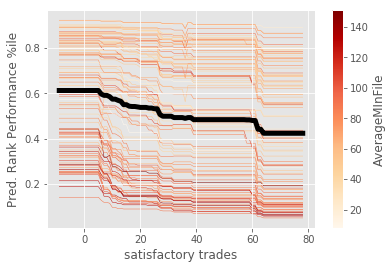

In [40]:
ice_plot(subset_satisfactory, linewidth=.5, color_by='AverageMInFile', cmap=cmap2, plot_pdp=True, 
         pdp_kwargs={'c': 'k', 'linewidth': 5})
plt.colorbar(sm, label='AverageMInFile')
plt.ylabel('Pred. Rank Performance %ile')
plt.xlabel('satisfactory trades');

#### LIME Analysis

In [42]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support
import itertools
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0, solver='lbfgs',
                          multi_class='multinomial').fit(features_train, labels_train)
labels_predict = clf.predict(features_test)
# clf.predict_proba() 
accuracy = accuracy_score(labels_test, labels_predict)

print('Accuracy: %.3f' % accuracy)
# predict probabilities
prob_logit = clf.predict_proba(features_test)
# keep probabilities for the positive outcome only
prob_logit = prob_logit[:, 1]
# calculate AUC
auc_logit = roc_auc_score(labels_test, prob_logit)
print('AUC: %.3f' % auc_logit)





Accuracy: 0.705
AUC: 0.774


In [43]:
from pygam import LogisticGAM
from sklearn.naive_bayes import GaussianNB
gam = LogisticGAM().fit(features_train, labels_train)

preds = gam.predict(features_test)
accuracy = accuracy_score(labels_test, preds)
prob = gam.predict_proba(features_test)
print(prob)
auc = roc_auc_score(labels_test, prob)

print('accuracy for GAM: {0}'.format(accuracy))
print('auc for GAM: {0}'.format(auc))

[ 0.9007232   0.37570979  0.50522174 ...,  0.74554428  0.10439835
  0.1182062 ]
accuracy for GAM: 0.7307202039515615
auc for GAM: 0.8031477232356747


In [44]:
models = {'gb':GradientBoostingClassifier(), 
          'mlp':MLPClassifier(), 
          'knn':KNeighborsClassifier(), 
          'reg':LogisticRegression(),
#           'GAM':LogisticGAM(),
          'Naive_bayes' : GaussianNB(),
          }

for model_key in models:
    model = models[model_key]
    model.fit(features_train, labels_train)
    preds = model.predict(features_test)
    prob = model.predict_proba(features_test)
    prob = prob[:, 1]
    auc = roc_auc_score(labels_test, prob)
    print("AUC for {0}: {1}".format(model_key, auc))
    accuracy = accuracy_score(labels_test, preds)
    print("Accuracy for {0}: {1}".format(model_key, accuracy))
    f1 = f1_score(labels_test, preds)
    print("F1 for {0}: {1}".format(model_key, f1))

AUC for gb: 0.7998224511679601
Accuracy for gb: 0.7278521351179095
F1 for gb: 0.7011896431070678
AUC for mlp: 0.7379435461529186
Accuracy for mlp: 0.6669853409815168
F1 for mlp: 0.6751631955237799
AUC for knn: 0.6872307026664102
Accuracy for knn: 0.6574251115360102
F1 for knn: 0.6369469773725093
AUC for reg: 0.7893793368685569
Accuracy for reg: 0.7189292543021033
F1 for reg: 0.6939625260235947
AUC for Naive_bayes: 0.7578491413448407
Accuracy for Naive_bayes: 0.6695347355003187
F1 for Naive_bayes: 0.6972262773722627


2018-10-22 16:53:21,594 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[23/23] features ████████████████████ Time elapsed: 3 seconds

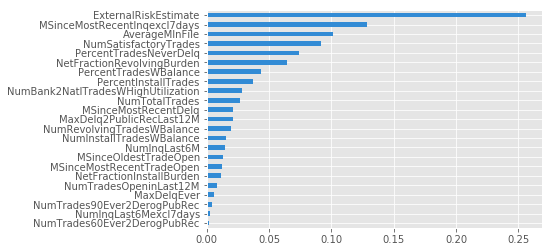

In [45]:

interpreter = Interpretation(features_test, feature_names=feature_label)
model = InMemoryModel(models['gb'].predict_proba, examples=features_train)
plots = interpreter.feature_importance.plot_feature_importance(model, ascending=True)

2018-10-22 16:53:30,208 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[23/23] features ████████████████████ Time elapsed: 4 seconds

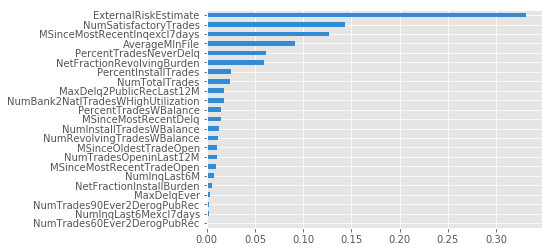

In [46]:
model_no_proba = InMemoryModel(models['gb'].predict, 
                      examples=features_train, 
                      unique_values=models['gb'].classes_)
plots = interpreter.feature_importance.plot_feature_importance(model_no_proba, ascending=True)

2018-10-22 16:53:36,517 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[29/29] grid cells ████████████████████ Time elapsed: 2 seconds

2018-10-22 16:53:39,546 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[29/29] grid cells ████████████████████ Time elapsed: 2 seconds

2018-10-22 16:53:42,453 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[29/29] grid cells ████████████████████ Time elapsed: 3 seconds

2018-10-22 16:53:46,208 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[29/29] grid cells ████████████████████ Time elapsed: 3 seconds

2018-10-22 16:53:49,846 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[29/29] grid cells ████████████████████ Time elapsed: 2 seconds

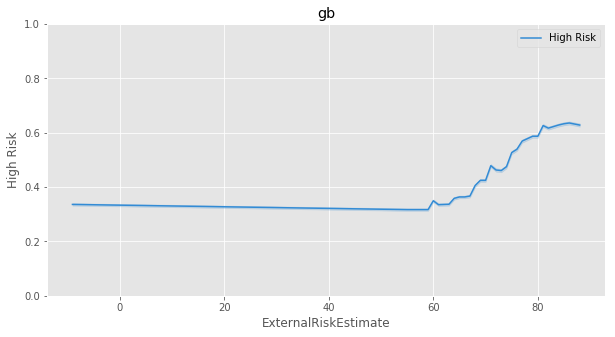

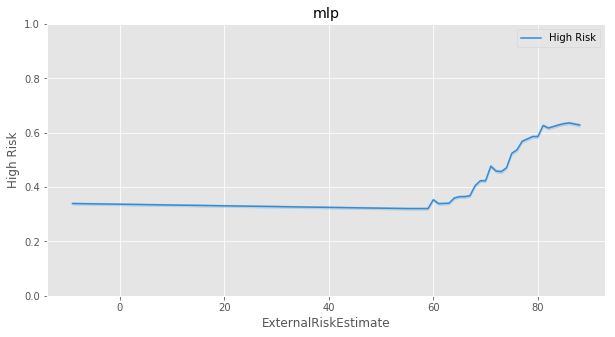

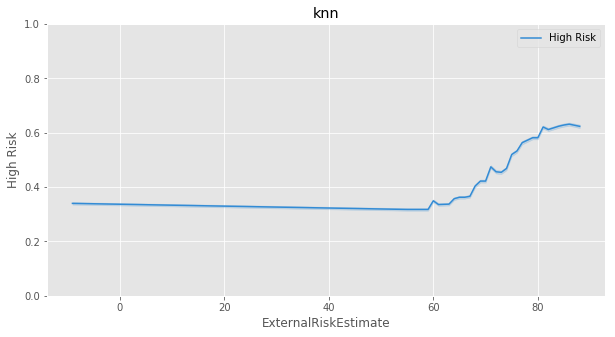

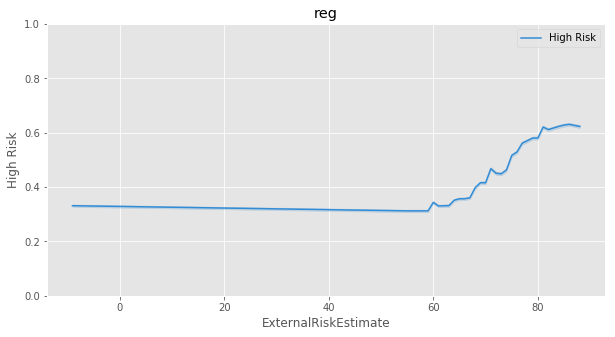

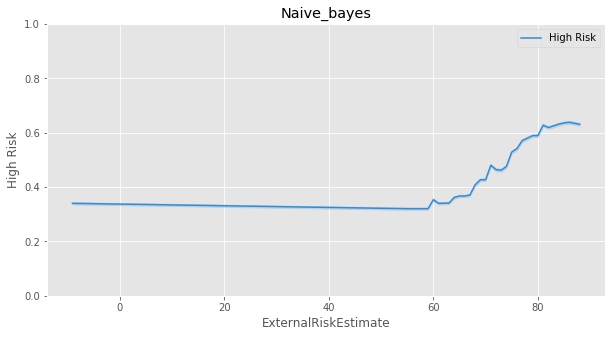

In [47]:
for model_key in models:
    pyint_model = InMemoryModel(models['gb'].predict_proba, examples=features_train, target_names=['Low Risk','High Risk'])
    axes_list = interpreter.partial_dependence.plot_partial_dependence(['ExternalRiskEstimate'],
                                                                       pyint_model, 
                                                                       grid_resolution=30, 
                                                                       with_variance=True,
                                                                       figsize = (10, 5))
    ax = axes_list[0][1]
    ax.set_title(model_key)
    ax.set_ylim(0, 1)

In [48]:

exp = LimeTabularExplainer(features_train.values, 
                           feature_names=features_train, 
                           discretize_continuous=True, 
                           class_names=['Low Risk ', 'High Risk '])
exp.explain_instance(features_train.iloc[0].values, models['gb'].predict_proba).show_in_notebook()

In [49]:
exp.explain_instance(features_train.iloc[0].values, models['knn'].predict_proba).show_in_notebook()

2018-10-22 16:54:05,285 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progressbar=False


[70/70] grid cells ████████████████████ Time elapsed: 7 seconds

[[<Figure size 1152x720 with 2 Axes>,
  <matplotlib.axes._subplots.Axes3DSubplot at 0x1a2376b7b8>]]

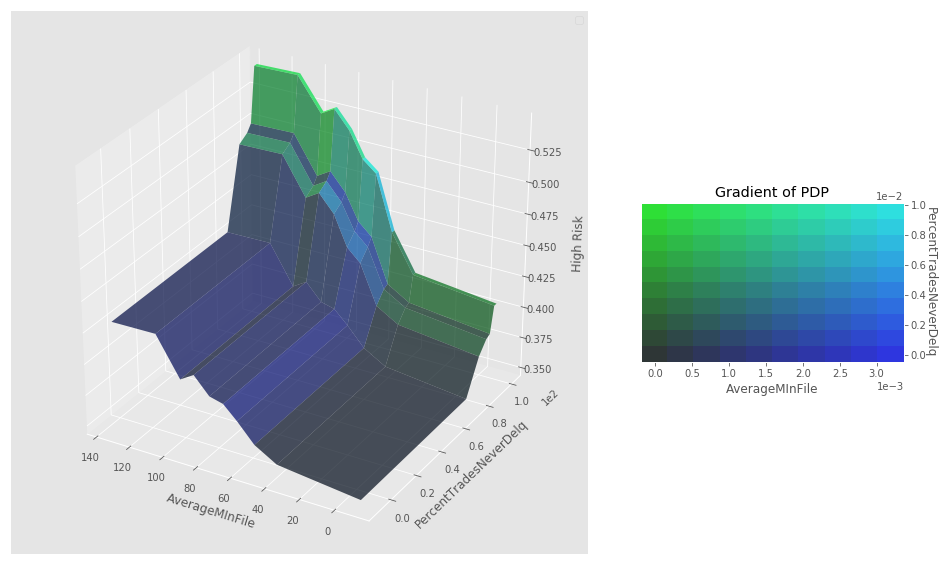

In [50]:
model = InMemoryModel(models['gb'].predict_proba, examples=features_train, target_names=['Low Risk ', 'High Risk'])
interpreter.partial_dependence.plot_partial_dependence([('AverageMInFile', 'PercentTradesNeverDelq')], model, 
                                                       grid_resolution=10)

In [51]:
class_names = np.asarray(['True','False'])

### Surrogate Models

In [52]:
from skater.core.global_interpretation.tree_surrogate import TreeSurrogate
from skater.util.dataops import show_in_notebook
from skater.model import InMemoryModel
import graphviz
# Using the interpreter instance invoke call to the TreeSurrogate
model_inst = InMemoryModel(models['gb'].predict, examples=features_train, model_type='classifier', unique_values=[1, 0],
                      feature_names=feature_label, target_names=['Low Risk ', 'High Risk'])


surrogate_explainer = interpreter.tree_surrogate(oracle=model_inst, seed=5)
surrogate_explainer.fit(features_train, labels_train, use_oracle=True, prune='post', scorer_type='default')
surrogate_explainer.plot_global_decisions(colors=['coral', 'lightsteelblue','darkkhaki'],
                                          file_name='simple_tree_pre.png')
show_in_notebook('simple_tree_pre.png', width=1000, height=6000)



2018-10-22 16:54:30,698 - skater.core.global_interpretation.tree_surrogate - INFO - post pruning applied ...
2018-10-22 16:54:30,770 - skater.core.global_interpretation.tree_surrogate - INFO - Scorer used f1-score
2018-10-22 16:54:30,773 - skater.core.global_interpretation.tree_surrogate - INFO - original score using base model 1.0
2018-10-22 16:54:31,863 - skater.core.global_interpretation.tree_surrogate - INFO - Summary: childrens of the following nodes are removed [3, 4, 5, 6, 7, 8, 10, 11, 15, 16, 20, 21, 22, 23, 26, 30, 31, 34, 36, 39, 40, 43, 44, 48, 51, 52, 55, 57, 58, 59, 63, 67, 69, 71, 72, 74, 75, 76, 83, 84, 86, 87, 93, 94, 95, 96, 97, 102, 107, 109, 110, 111, 114, 118, 119, 120, 121, 123, 126, 128, 130, 139]
2018-10-22 16:54:31,865 - skater.core.global_interpretation.tree_surrogate - INFO - Done generating prediction using the surrogate, shape (7321,)
2018-10-22 16:54:31,872 - skater.core.global_interpretation.tree_surrogate - INFO - Done scoring, surrogate score 0.99; orac

### SHAP

In [53]:
# print the JS visualization code to the notebook
shap.initjs()

In [54]:
params = {
    "eta": 0.01,
    "objective": "binary:logistic",
    "subsample": 0.5,
    "base_score": np.mean(labels_train),
    "eval_metric": "logloss"
}
model = xgboost.train(params, dtrain, 5000, evals = [(dtest, "test")], verbose_eval=100, early_stopping_rounds=20)

[16:54:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 108 extra nodes, 0 pruned nodes, max_depth=6
[0]	test-logloss:0.689455
Will train until test-logloss hasn't improved in 20 rounds.
[16:54:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=6
[16:54:56] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 0 pruned nodes, max_depth=6
[16:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 108 extra nodes, 0 pruned nodes, max_depth=6
[16:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes, max_depth=6
[16:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 112 extra nodes, 0 pruned nodes, max_depth=6
[16:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 98 extra nodes, 0 pruned nodes, max_depth=6
[16:54:57] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=6
[16:54:57] 

[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 98 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 94 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 102 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 98 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=6
[16:54:58] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes,

[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 114 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 108 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 96 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=6
[16:54:59] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes

[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 88 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 84 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 96 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=6
[16:55:01] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 98 extra nodes, 0 pruned nodes, max

[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=6
[300]	test-logloss:0.545666
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=6
[16:55:02] src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra

#### Classic feature attributions
Here we try out the global feature importance calcuations that come with XGBoost. Note that they all contradict each other, which motivates the use of SHAP values since they come with consistency gaurentees (meaning they will order the features correctly).

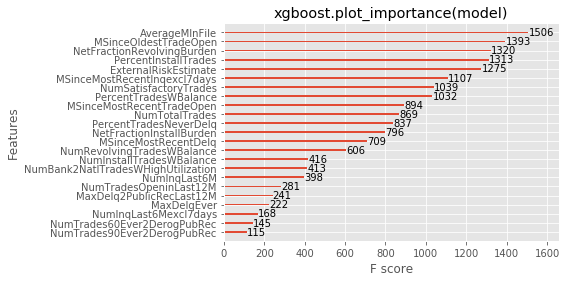

In [55]:
xgboost.plot_importance(model)
pl.title("xgboost.plot_importance(model)")
pl.show()

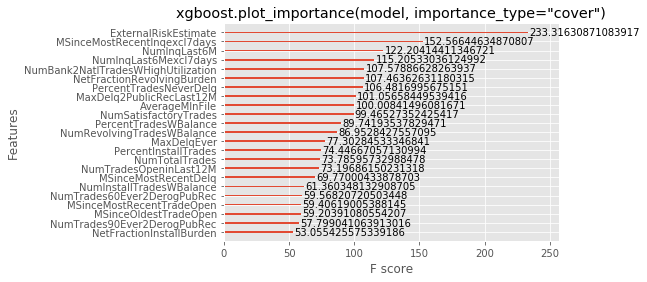

In [56]:
xgboost.plot_importance(model, importance_type="cover")
pl.title('xgboost.plot_importance(model, importance_type="cover")')
pl.show()

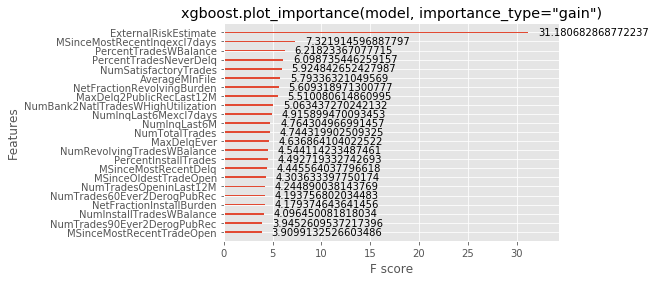

In [57]:
xgboost.plot_importance(model, importance_type="gain")
pl.title('xgboost.plot_importance(model, importance_type="gain")')
pl.show()

#### Explain predictions

In [58]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(features)

#### Visualize a single prediction

In [59]:
shap.force_plot(explainer.expected_value, shap_values[0,:], features.iloc[0,:])

#### Visualize many predictions

In [60]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:], features.iloc[:1000,:])

#### Bar chart of mean importance¶

This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.



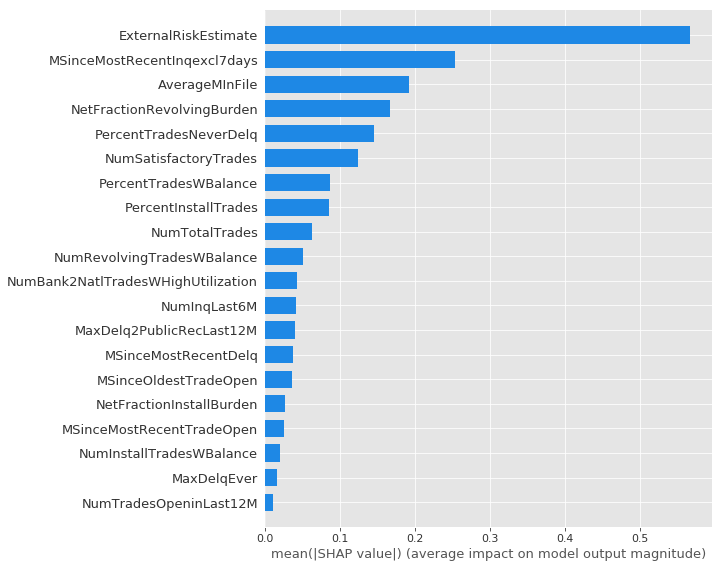

In [61]:
shap.summary_plot(shap_values, features, plot_type="bar")


#### SHAP Summary Plot
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

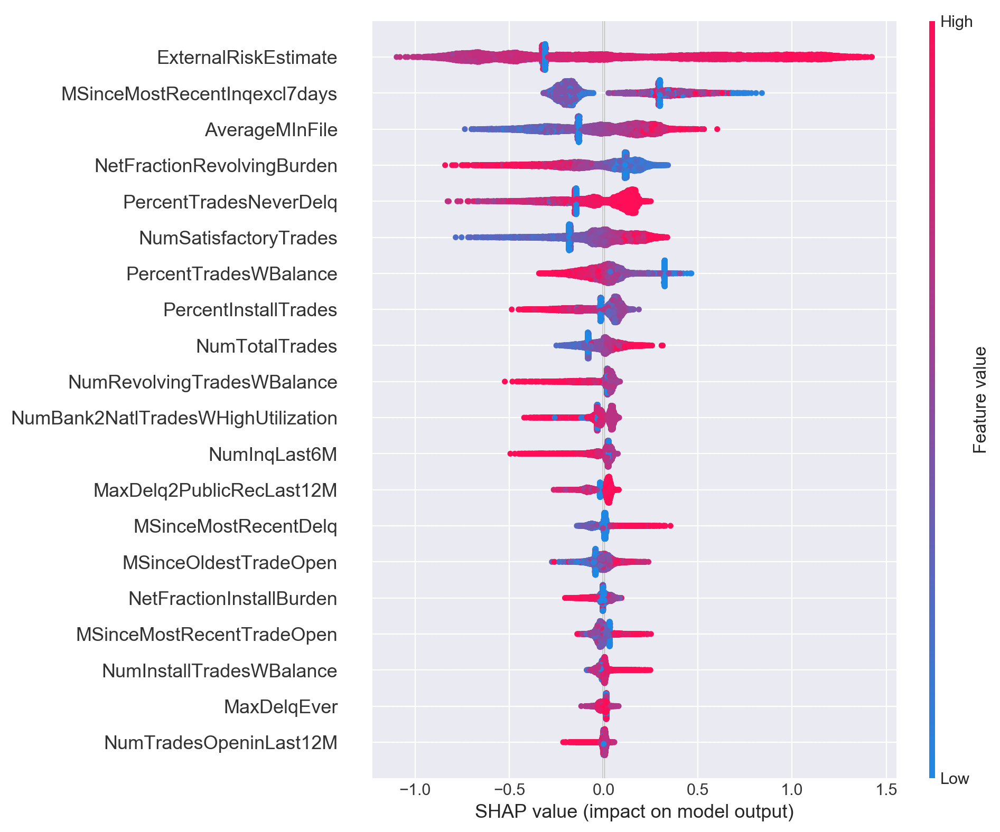

In [110]:
%matplotlib inline 

import matplotlib as mpl
mpl.rcParams['figure.dpi']= 200


shap.summary_plot(shap_values, features)

In [111]:
import matplotlib as mpl
mpl.rc("savefig", dpi=200)

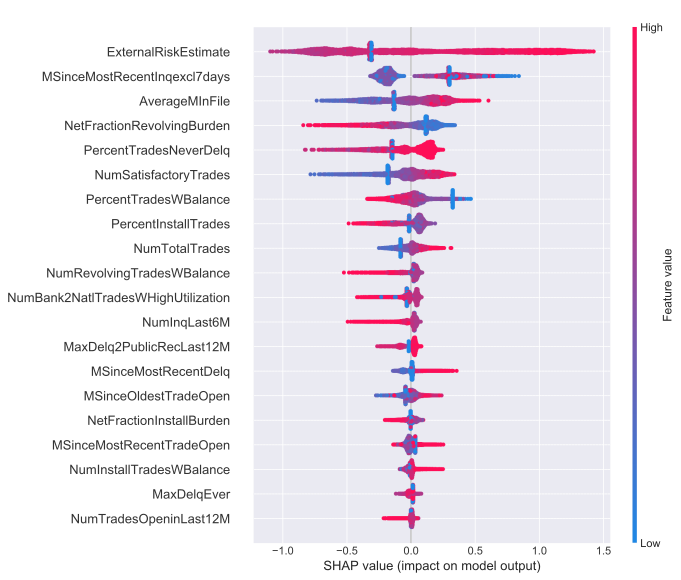

In [112]:
%config InlineBackend.figure_format = 'svg'

shap.summary_plot(shap_values, features)

#### Monotonic vs Non monotonicity.

In [69]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import OrderedDict
from ipywidgets import interactive, fixed

plt.style.use('seaborn-darkgrid')
rndst = np.random.RandomState(0)

In [70]:
def generate_data(n=20, p=0, a=1, b=1, c=0, latent_sigma_y=20):
    '''
    Create a toy dataset based on a very simple model that we might
    imagine is a noisy physical process:
        1. random x values within a range
        2. latent error aka inherent noise in y
        3. optionally create labelled outliers with larger noise

    Model form: y ~ a + bx + cx^2 + e

    NOTE: latent_sigma_y is used to create a normally distributed,
    'latent error' aka 'inherent noise' in the 'physical' generating
    process, rather than experimental measurement error.
    Please don't use the returned `latent_error` values in inferential
    models, it's returned in the dataframe for interest only.
    '''

    df = pd.DataFrame({'x':rndst.choice(np.arange(100), n, replace=False)})

    ## create linear or quadratic model
    df['y'] = a + b*(df['x']) + c*(df['x'])**2

    ## create latent noise and marked outliers
    df['latent_error'] = rndst.normal(0, latent_sigma_y, n)
    df['outlier_error'] = rndst.normal(0, latent_sigma_y*10, n)
    df['outlier'] = rndst.binomial(1, p, n)

    ## add noise, with extreme noise for marked outliers
    df['y'] += ((1-df['outlier']) * df['latent_error'])
    df['y'] += (df['outlier'] * df['outlier_error'])

    ## round
    for col in ['y','latent_error','outlier_error','x']:
        df[col] = np.round(df[col],3)

    ## add label
    df['source'] = 'linear' if c == 0 else 'quadratic'

    ## create simple linspace for plotting true model
    plotx = np.linspace(df['x'].min() - np.ptp(df['x'])*.1,
                        df['x'].max() + np.ptp(df['x'])*.1, 100)

    ploty = a + b * plotx + c * plotx ** 2
    dfp = pd.DataFrame({'x':plotx, 'y':ploty})

    return df, dfp


def interact_dataset(n=20, p=0, a=-30, b=5, c=0, latent_sigma_y=20):
    '''
    Convenience function:
    Interactively generate dataset and plot
    '''

    df, dfp = generate_data(n, p, a, b, c, latent_sigma_y)

    g = sns.FacetGrid(df, size=8, hue='outlier', hue_order=[True,False]
                    ,palette=sns.color_palette('Set1'), legend_out=False)

    g.map(plt.errorbar, 'x', 'y', 'latent_error', marker="o",
          ms=10, mec='w', mew=2, ls='', elinewidth=0.7).add_legend()

    plt.plot(dfp['x'], dfp['y'], '--', alpha=0.8)

    plt.subplots_adjust(top=0.92)
    g.fig.suptitle('Sketch of Data Generation ({})'.format(df['source'][0]), fontsize=16)


def plot_datasets(df_lin, df_quad, dfp_lin, dfp_quad):
    '''
    Convenience function:
    Plot the two generated datasets in facets with generative model
    '''

    df = pd.concat((df_lin, df_quad), axis=0)

    g = sns.FacetGrid(col='source', hue='source', data=df, size=6,
                      sharey=False, legend_out=False)

    g.map(plt.scatter, 'x', 'y', alpha=0.7, s=100, lw=2, edgecolor='w')

    g.axes[0][0].plot(dfp_lin['x'], dfp_lin['y'], '--', alpha=0.6)
    g.axes[0][1].plot(dfp_quad['x'], dfp_quad['y'], '--', alpha=0.6)


def plot_traces(traces, retain=1000):
    '''
    Convenience function:
    Plot traces with overlaid means and values
    '''

    ax = pm.traceplot(traces[-retain:], figsize=(12,len(traces.varnames)*1.5),
        lines={k: v['mean'] for k, v in pm.summary(traces[-retain:]).iterrows()})

    for i, mn in enumerate(pm.summary(traces[-retain:])['mean']):
        ax[i,0].annotate('{:.2f}'.format(mn), xy=(mn,0), xycoords='data',
                         xytext=(5,10), textcoords='offset points', rotation=90,
                         va='bottom', fontsize='large', color='#AA0022')


def create_poly_modelspec(k=1):
    '''
    Convenience function:
    Create a polynomial modelspec string for patsy
    '''
    return ('y ~ 1 + x ' + ' '.join(['+ np.power(x,{})'.format(j)
                                     for j in range(2, k+1)])).strip()


def run_models(df, upper_order=5):
    '''
    Convenience function:
    Fit a range of pymc3 models of increasing polynomial complexity.
    Suggest limit to max order 5 since calculation time is exponential.
    '''

    models, traces = OrderedDict(), OrderedDict()

    for k in range(1, upper_order+1):

        nm = 'k{}'.format(k)
        fml = create_poly_modelspec(k)

        with pm.Model() as models[nm]:

            print('\nRunning: {}'.format(nm))
            pm.glm.GLM.from_formula(fml, df,
                                    priors={'Intercept':pm.Normal.dist(mu=0, sd=100)},
                                    family=pm.glm.families.Normal())

            traces[nm] = pm.sample(2000)

    return models, traces


def plot_posterior_cr(models, traces, rawdata, xlims,
                      datamodelnm='linear', modelnm='k1'):
    '''
    Convenience function:
    Plot posterior predictions with credible regions shown as filled areas.
    '''

    ## Get traces and calc posterior prediction for npoints in x
    npoints = 100
    mdl = models[modelnm]
    trc = pm.trace_to_dataframe(traces[modelnm][-1000:])
    trc = trc[[str(v) for v in mdl.cont_vars[:-1]]]

    ordr = int(modelnm[-1:])
    x = np.linspace(xlims[0], xlims[1], npoints).reshape((npoints,1))
    pwrs = np.ones((npoints,ordr+1)) * np.arange(ordr+1)
    X = x ** pwrs
    cr = np.dot(X, trc.T)

    ## Calculate credible regions and plot over the datapoints
    dfp = pd.DataFrame(np.percentile(cr,[2.5, 25, 50, 75, 97.5], axis=1).T,
                       columns=['025','250','500','750','975'])
    dfp['x'] = x

    pal = sns.color_palette('Greens')
    f, ax1d = plt.subplots(1,1, figsize=(7,7))
    f.suptitle('Posterior Predictive Fit -- Data: {} -- Model: {}'.format(datamodelnm,
                                                                          modelnm), fontsize=16)
    plt.subplots_adjust(top=0.95)

    ax1d.fill_between(dfp['x'], dfp['025'], dfp['975'], alpha=0.5,
                      color=pal[1], label='CR 95%')
    ax1d.fill_between(dfp['x'], dfp['250'], dfp['750'], alpha=0.5,
                      color=pal[4], label='CR 50%')
    ax1d.plot(dfp['x'], dfp['500'], alpha=0.6, color=pal[5], label='Median')

    plt.legend()
    ax1d.set_xlim(xlims)
    sns.regplot(x='x', y='y', data=rawdata, fit_reg=False,
                scatter_kws={'alpha':0.7,'s':100, 'lw':2,'edgecolor':'w'}, ax=ax1d)

In [71]:
interactive(interact_dataset, n=[5,50,5], p=[0,.5,.05], a=[-50,50],
            b=[-10,10], c=[-3,3], latent_sigma_y=[0,1000,50])

interactive(children=(Dropdown(description='n', options=(5, 50, 5), value=5), Dropdown(description='p', options=(0, 0.5, 0.05), value=0), Dropdown(description='a', options=(-50, 50), value=-50), Dropdown(description='b', options=(-10, 10), value=-10), Dropdown(description='c', options=(-3, 3), value=-3), Dropdown(description='latent_sigma_y', options=(0, 1000, 50), value=0), Output()), _dom_classes=('widget-interact',))

In [69]:
n = 12
df_lin, dfp_lin = generate_data(n=n, p=0, a=-30, b=5, c=0, latent_sigma_y=40)
df_quad, dfp_quad = generate_data(n=n, p=0, a=-200, b=2, c=3, latent_sigma_y=500)

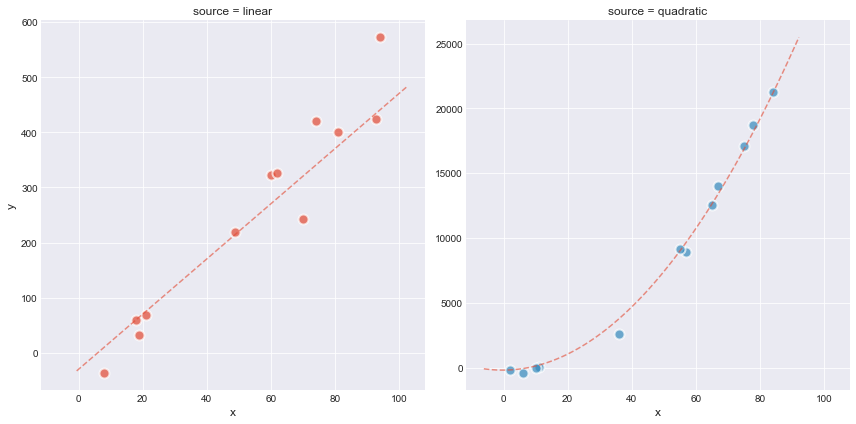

In [70]:
plot_datasets(df_lin, df_quad, dfp_lin, dfp_quad)

[<matplotlib.lines.Line2D at 0x1a2a481e48>]

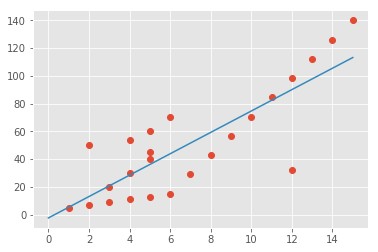

In [68]:
from scipy import optimize
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

x = np.array([1, 2, 3, 4, 5, 6, 7, 8, 9, 10 ,11, 12, 13, 14, 15,3,4,5,2,5,6,4,5,12], dtype=float)
y = np.array([5, 7, 9, 11, 13, 15, 28.92, 42.81, 56.7, 70.59, 84.47, 98.36, 112.25, 126.14, 140.03,20,30,40,50,60,70,54,45,32])

def piecewise_linear(x, x0, y0, k1, k2):
    return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

p , e = optimize.curve_fit(piecewise_linear, x, y)
xd = np.linspace(0, 15, 100)
plt.plot(x, y, "o")
plt.plot(xd, piecewise_linear(xd, *p))

In [94]:
x = np.random.randint(50, size=30)

In [95]:
x

array([27, 43, 32, 39, 45, 24, 41,  1, 49, 31,  9, 43, 43, 32, 22, 10, 42,
       14, 26, 44,  0, 27,  0, 10, 20,  7, 38, 40, 38,  5])

In [96]:
y = np.array([1,2,3,4,5,6,7,8,9,10,1,2,3,4,5,6,7,8,9,10,1,2,3,4,5,6,7,8,9,10])

In [97]:
y

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10,  1,  2,  3,  4,  5,  6,  7,
        8,  9, 10,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

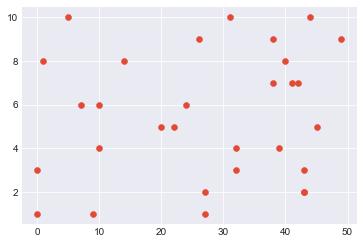

In [98]:
plt.scatter(x,y)